# Анализ рынка заведений общественного питания Москвы

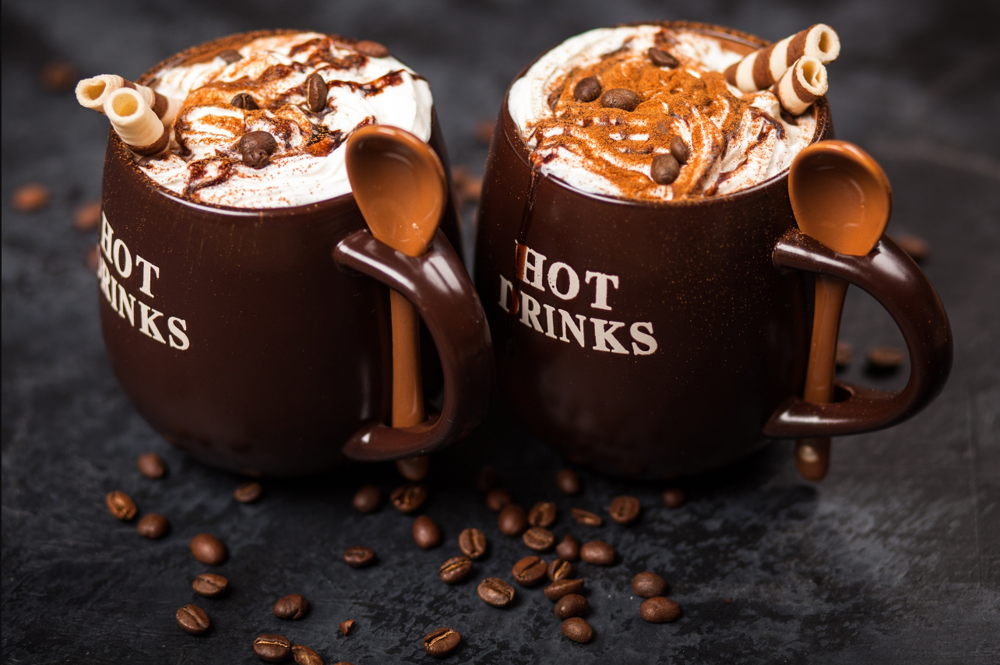

**Содержание** <a class='anchor' id='table_of_contents'></a>

* [Описание проекта](#description)
* [Описание данных](#data)
* [Шаг 1. Загрузка данных и изучение общей информации](#step_1)
* [Шаг 2. Предобработка данных](#step_2)
* [Шаг 3. Анализ данных](#step_3)
    * [Распределение категорий объектов](#step_3_1)
    * [Анализ посадочных мест по категориям](#step_3_2)
    * [Соотношение сетевых и несетевых заведений](#step_3_3)
    * [Соотношение сетевых и несетевых заведений по категориям](#step_3_4)
    * [Топ-15 популярных сетей питания](#step_3_5)
    * [Распределение категорий по округам](#step_3_6)
    * [Распределение средних рейтингов по категориям](#step_3_7)
    * [Хороплет со средний рейтингом заведений по округам](#step_3_8)
    * [Кластеры заведений на карте](#step_3_9)
    * [Топ-15 улиц по количеству заведений](#step_3_10)
    * [Улицы с одном объектом питания](#step_3_11)
    * [Хороплет со средним чеком по округам](#step_3_12)
    * [Исследование заведений с низким рейтингом](#step_3_13)
    * [Выводы](#step_3_14)
* [Шаг 4. Исследование рынка кофеен](#step_4)
* [Шаг 5. Вывод](#final)

## Описание проекта <a class='anchor' id='description'></a>

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала требуется аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Необходимо сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями исследования. Выбирать инструменты (`matplotlib`, `seaborn` и другие) и типы визуализаций можно самостоятельно.

**Презентация:** https://drive.google.com/file/d/1kJDeKPSke-TSV8TmlnbHYnPNNwki_MQT/view?usp=share_link

## Описание данных <a class='anchor' id='data'></a>

Доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

Файл `moscow_places.csv`:
- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
  - «Средний счёт: 1000–1500 ₽»;
  - «Цена чашки капучино: 130–220 ₽»;
  - «Цена бокала пива: 400–600 ₽» и так далее;
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Средний счёт»:
  - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Цена одной чашки капучино»:
  - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
  - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
  - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);
- `district` — административный район, в котором находится заведение, например Центральный административный округ;
- `seats` — количество посадочных мест.

[Назад к содержанию](#table_of_contents)

## Шаг 1. Загрузка данных и изучение общей информации <a class='anchor' id='step_1'></a>

Загрузим все необходимые библиотеки и вспомогательные функции.

In [1]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import plotly.express as px
import seaborn as sns
import urllib.request
import json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot
init_notebook_mode(connected=True)

pd.set_option("display.precision", 2)

In [2]:
# функция для подсчета дубликатов и получения общих сведений о датасете
def get_info(data):
    display(data.head())
    print('Число дубликатов:', data.duplicated().sum())
    print()
    data.info()

In [3]:
# функция для подсчета доли пропусков
def get_na(data):
    na_info = (
        pd.DataFrame(data.isna().mean())
        .rename(columns={0: 'NaN'})
        .style
        .set_caption('Доля пропусков')
        .background_gradient('coolwarm')
        .format('{:.2%}')
        )
    return na_info

In [4]:
data = pd.read_csv('moscow_places.csv')

In [6]:
with open("admin_level_geomap.geojson") as json_file:
    state_geo = json.load(json_file)

Изучим общую информацию о датасете.

In [7]:
get_info(data)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Число дубликатов: 0

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Датасет имеет 8 406 строк и 14 столбцов. 6 столбцов формата `float64`, 1 столбец в формате `int64` и 7 строковых столбцов (формат `object`). Явных дубликатов в датасете не найдено.

Узнаем, сколько заведений и их уникальных названий представлено в датасете.

In [8]:
print('Число заведений:', len(data))
print('Число уникальных названий:', data['name'].nunique())

Число заведений: 8406
Число уникальных названий: 5614


[Назад к содержанию](#table_of_contents)

## Шаг 2. Предобработка данных <a class='anchor' id='step_2'></a>

Проверим датасет на наличие неявных дубликатов в связке названий и адресов, создав копию датафрейма и приведя столбцы к нижнему регистру.

In [9]:
data_copy = data.copy(deep=True)

data_copy['name'] = data_copy['name'].str.lower()
data_copy['address'] = data_copy['address'].str.lower()

data_copy[data_copy[['name', 'address']].duplicated()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.53,3.2,NaN,NaN,NaN,NaN,0,NaN
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.81,37.50,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.81,37.64,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.74,37.41,4.1,NaN,NaN,NaN,NaN,0,276.0


Как мы видим, найдено 4 строки с неявными дубликатами. Определим индексы этих строк и исключим их из основного датафрейма `data`.

In [10]:
rows_to_drop = data_copy[data_copy[['name', 'address']].duplicated()].index

data = data.drop(index=rows_to_drop).reset_index(drop=True)

В датасете также можно обнаружить дубликаты с сетью "Яндекс Лавка" - с разделяющей точкой по середине названия и без. Узнаем их количество.

In [11]:
print('Строки с Яндекс Лавка:', len(data[data['name'] == 'Яндекс Лавка']))
print('Строки с Яндекс.Лавка:', len(data[data['name'] == 'Яндекс.Лавка']))

Строки с Яндекс Лавка: 69
Строки с Яндекс.Лавка: 3


Приведем все подобные названия к единому формату - "Яндекс Лавка" (без разделяющей точки).

In [12]:
data.loc[data['name'] == 'Яндекс.Лавка', 'name'] = 'Яндекс Лавка'

Теперь проверим датасет на наличие пропусков и узнаем их количество.

In [13]:
get_na(data)

,NaN
name,0.00%
category,0.00%
address,0.00%
district,0.00%
hours,6.37%
lat,0.00%
lng,0.00%
rating,0.00%
price,60.55%
avg_bill,54.58%


В датасете имеется значительное количество пропусков. Некоторые столбцы можно было бы заполнить медианными значениями внутри каждой категории, однако, это преобразование сильно исказит распределение данных в дальнейшем анализе (к примеру, количество мест, средний рейтинг и средний чек). В связи с этим оставим пропуски как есть во всех столбцах, кроме столбца `hours` - в нем заполним пропуски прочерком.

In [14]:
data['hours'] = data['hours'].fillna('-')

Чтобы выделить название улицы из полного адреса объекта, воспользуемся строковым методом `split`. Чаще всего структура адреса состоит из трех элементов:

`<город>, <улица>, <номер дома>`

Однако, в датасете встречаются исключения, когда в структуре адреса больше элементов: 

`<город>, <округ>, <район>, <улица>, <номер дома>`

Посмотрим на примеры таких адресов и посчитаем, сколько подобных случаев встречается в датасете.

In [15]:
for i in data[(data['address'].str.contains('Южный административный округ', case=False, regex=False))]['address'].tail():
    if len(i.split(',')) > 3:
        print(i)

print('Всего адресов:', len(data[data['address'].str.contains('округ', case=False, regex=False)]))

Москва, Южный административный округ, район Чертаново Северное, микрорайон Северное Чертаново, к208
Москва, Южный административный округ, район Орехово-Борисово Северное, Дольская улица, 10, стр. 3
Москва, Южный административный округ, район Орехово-Борисово Северное, Дольская улица, 1, стр. 12
Москва, Южный административный округ, район Орехово-Борисово Северное, Дольская улица, 1, стр. 5
Москва, Южный административный округ, район Орехово-Борисово Северное, Воздушная улица
Всего адресов: 73


Создадим функцию `extract_street`, в которой предусмотрим оба возможных случая. Чтобы получить улицу, обратимся к элементу с индексом 1, разбив строку по запятой. Полученные значения запишем в столбец `street`.

В тех адресах, где не указана улица, останется только обозначение района.

In [16]:
def extract_street(row):
    if 'округ' in row['address']:
        for i in row['address'].split(','):
            if 'улица' in i:
                return i
    return row['address'].split(',')[1]
 
data['street'] = data.apply(extract_street, axis=1)

Посмотрим на случайную выборку строк из датафрейма для оценки корректности преобразований.

In [17]:
data.sort_values(by='street')[['name', 'address', 'street']].sample(n=10)

,name,address,street
5452,Кебаб Хауз,"Москва, Кетчерская улица, 2Ас4",Кетчерская улица
1831,Amarena,"Москва, Ходынский бульвар, 2",Ходынский бульвар
270,Алали,"Москва, Староватутинский проезд, 14",Староватутинский проезд
3637,Кулинарная лавка братьев Караваевых,"Москва, Тверской бульвар, 20, стр. 4",Тверской бульвар
8152,Кушать подано,"Москва, Волгоградский проспект, 35",Волгоградский проспект
5699,Кофемания,"Москва, Мосфильмовская улица, 1А",Мосфильмовская улица
5248,The Library Bar,"Москва, улица Бахрушина, 11",улица Бахрушина
4377,Сюр,"Москва, Большой Трёхсвятительский переулок, 2/1с8",Большой Трёхсвятительский переулок
5223,Баракат,"Москва, Большая Серпуховская улица, 8/7с2",Большая Серпуховская улица
1701,Кухня Востока,"Москва, Новодмитровская улица, 5А, стр. 2",Новодмитровская улица


В датасете можно встретить подозрительное заведение "Енот" с некорректным адресом. Попробуем разобраться, что с ним не так.

In [18]:
data.loc[data['name'] == 'Енот']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
6305,Енот,кафе,"Москва, № 7",Южный административный округ,-,55.68,37.62,4.8,NaN,NaN,NaN,NaN,0,NaN,№ 7


Дело в том, что данное заведение находится на территории горнолыжного комплекса Кант на склоне №7 и не имеет точного адреса. Тем не менее, запишем в датафрейм более корректные сведения о местонахождении объекта.

In [19]:
data.loc[data['name'] == 'Енот', 'address'] = 'Москва, Южный административный округ, Нагорный район, горнолыжный комплекс Кант, склон №7'
data.loc[data['name'] == 'Енот', 'street'] = 'горнолыжный комплекс Кант, склон №7'
data[data['name'] == 'Енот']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
6305,Енот,кафе,"Москва, Южный административный округ, Нагорный...",Южный административный округ,-,55.68,37.62,4.8,NaN,NaN,NaN,NaN,0,NaN,"горнолыжный комплекс Кант, склон №7"


Теперь все в порядке, продолжим предобработку.

Создадим функцию `replace_duplicates` для устранения не найденных неявных дубликатов - сокращения улиц, проспектов и шоссе.

In [20]:
def replace_duplicates(row):
    if 'ул.' in row:
        row = row.replace('ул.', 'улица')
    elif 'пр-т' in row:
        row = row.replace('пр-т', 'проспект')
    elif 'ш.' in row:
        row = row.replace('ш.', 'шоссе')
    return row

data['street'] = data['street'].apply(replace_duplicates)

Создадим столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно. Узнаем, сколько таких заведений есть в датасете.

In [21]:
print('Круглосуточных заведений:', len(data[(data['hours'].str.contains('ежедневно') & (data['hours'].str.contains('круглосуточно')))]))

Круглосуточных заведений: 730


Запишем их в новый столбец.

In [22]:
data['is_24/7'] = ((data['hours'].str.contains('ежедневно') & (data['hours'].str.contains('круглосуточно'))))

Допольнительно подсчитаем количество уникальных улиц, полученных в датасете после предобработки.

In [23]:
data['hours'].str.contains('ежедневно, круглосуточно')

0       False
1       False
2       False
3       False
4       False
        ...  
8397    False
8398    False
8399     True
8400     True
8401     True
Name: hours, Length: 8402, dtype: bool

In [24]:
print('Уникальных улиц:', data['street'].nunique())

Уникальных улиц: 1454


[Назад к содержанию](#table_of_contents)

## Шаг 3. Анализ данных <a class='anchor' id='step_3'></a>

### 1. Распределение категорий объектов <a class='anchor' id='step_3_1'></a>

Рассмотрим, какие категории заведений представлены в данных - исследуем количество объектов общественного питания по категориям и изучим их распределение.


In [25]:
categories_grouped = (pd
                      .pivot_table(data, 
                                   index='category', 
                                   values='name', 
                                   aggfunc='count')
                      .rename(columns={'name':'cnt'})
                      .sort_values(by='cnt', 
                                   ascending=False)
                      .reset_index())

Посмотрим, какие категории заведений представлены в датасете - подсчитаем количество заведений каждого типа.

In [26]:
categories_grouped.style.background_gradient(low=0.5)

,category,cnt
0,кафе,2376
1,ресторан,2042
2,кофейня,1413
3,"бар,паб",764
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


Отобразим полученные данные на круговой диаграмме.

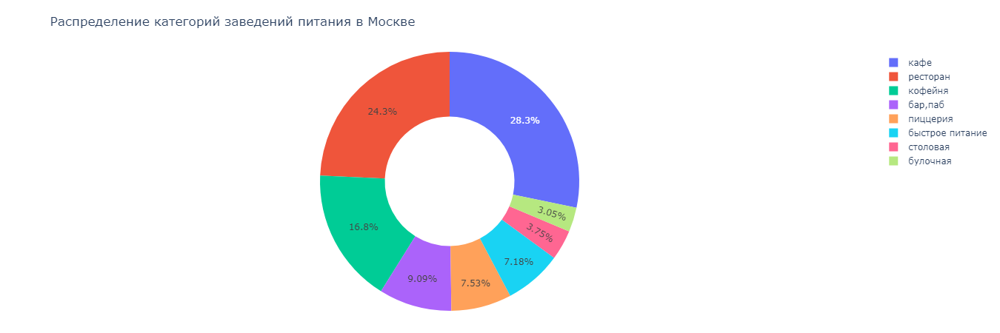

In [27]:
labels = categories_grouped['category']
values = categories_grouped['cnt']

fig = go.Figure(data=[go.Pie(labels=labels, 
                             values=values, 
                             hole=.5)])
fig.update_layout(
    autosize=False,
    width=700,
    height=450,
    margin=dict(
        l=50,
        r=50,
        b=30,
        t=70,
        pad=4
    ),
    title='Распределение категорий заведений питания в Москве'
)
fig.show()

Наибольшая доля заведений относится к следующим типам: 
- кафе (28.3%, 2 376 шт.);
- ресторан (24.3%, 2 042 шт.); 
- кофейня (16.8%, 1 413 шт.).

Меньше всего заведений в следующих категориях:
- столовая (3.75%, 315 шт.);
- булочная (3.05%, 256 шт.).

### 2. Анализ посадочных мест по категориям <a class='anchor' id='step_3_2'></a>

Исследуем количество посадочных мест в местах по категориям - рассчитаем среднее и медиану.

In [28]:
(pd
 .pivot_table(data, 
              index='category', 
              values='seats', 
              aggfunc=['mean', 'median'])
 .reset_index()
 .droplevel(1, axis=1)
 .sort_values(by='mean', ascending=False)
 .style
 .background_gradient(low=0.5)
)

,category,mean,median
0,"бар,паб",124.48,82.00
6,ресторан,121.89,86.00
4,кофейня,111.20,80.00
7,столовая,99.75,75.50
2,быстрое питание,98.89,65.00
3,кафе,97.37,60.00
5,пиццерия,94.50,55.00
1,булочная,89.39,50.00


Больше всего посадочных мест в среднем имеют бары и пабы (124 мест), рестораны (122 мест) и кофейни (111 мест). Медиана и среднее существенно различаются, что говорит о сильном размахе максимальных значений во всех категориях. Рассмотрим распределение значений с помощью диаграммы размаха.

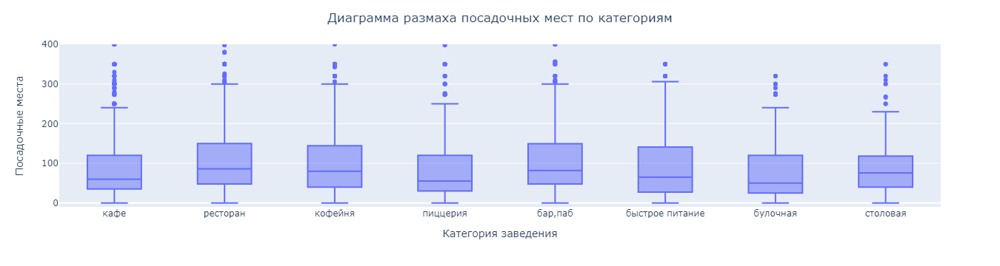

In [29]:
fig = px.box(data, 
             x="category", 
             y="seats", 
             range_y=[-10, 400])
fig.update_layout(
    title={
        'text': 'Диаграмма размаха посадочных мест по категориям',
        'xanchor': 'center',
        'yanchor': 'top',
        'y':0.95,
        'x':0.5},
        yaxis_title='Посадочные места',
        xaxis_title='Категория заведения')
fig.show()

В самых крупных ресторанах, кофейнях, барах (пабах) и заведениях быстрого питания - количество посадочных мест может достигать 300 и более. Данные заведения являются самыми вместительными, в среднем количество мест в них составляет 100-125 (медианный диапазон 65-86 мест).

К наиболее компактным заведениям относятся кафе, пиццерии, булочные и столовые. Количество посадочных мест в них редко превышает диапазон 120-250. Среднее число мест варьируется в диапазоне 90-100 мест (медианный диапазон 50-76 мест).

Посмотрим, есть ли различие между вместительностью сетевых и несетевых заведений.

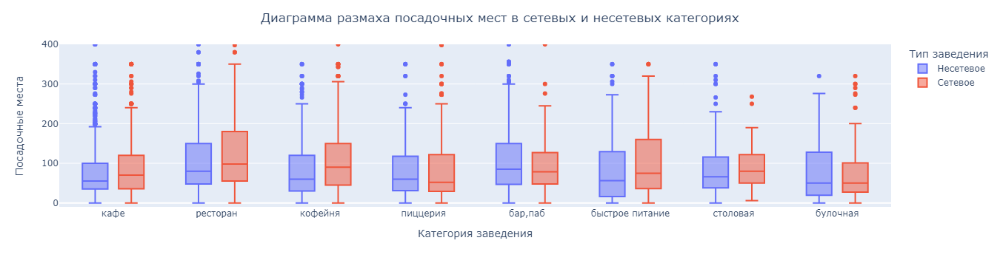

In [30]:
fig = px.box(data, x="category", y="seats", range_y=[-10, 400], color='chain')
fig.update_layout(
    title={
        'text': 'Диаграмма размаха посадочных мест в сетевых и несетевых категориях',
        'xanchor': 'center',
        'yanchor': 'top',
        'y':0.95,
        'x':0.5},
        yaxis_title='Посадочные места',
        xaxis_title='Категория заведения')
newnames = {'0':'Несетевое', '1': 'Сетевое'}
fig.update_layout(legend_title_text="Тип заведения")
fig.for_each_trace(lambda t: t.update(name = newnames[t.name]))
fig.show()

В большинстве категорий сетевые заведения являются более вместительными. Самыми крупными заведениями являются сетевые рестораны: их средний размер может достигать 350 мест (медиана 98, максимум 1 288). Исключениями являются бары и булочные - несетевые заведения этих категорий чаще имеют больше посадочных мест.

Посмотрим, есть ли взаимосвязь между режимом работы заведения и его вместительностью.

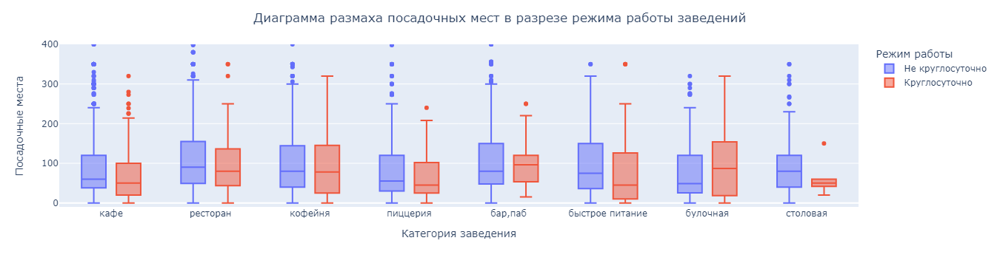

In [31]:
fig = px.box(data, x="category", y="seats", range_y=[-10, 400], color='is_24/7')
fig.update_layout(
    title={
        'text': 'Диаграмма размаха посадочных мест в разрезе режима работы заведений',
        'xanchor': 'center',
        'yanchor': 'top',
        'y':0.95,
        'x':0.5},
        yaxis_title='Посадочные места',
        xaxis_title='Категория заведения')
newnames = {'False':'Не круглосуточно', 'True': 'Круглосуточно'}
fig.update_layout(legend_title_text="Режим работы")
fig.for_each_trace(lambda t: t.update(name = newnames[t.name]))
fig.show()

Заведения, работающие круглосуточно, как правило, имеют меньше посадочных мест и являются более компактными по сравнению с заведениями, работающими в обычном режиме (не круглосуточно). 
Исключения составляют кофейни и булочные:
- круглосуточные кофейни не отличаются по размерам от некруглосуточных; 
- круглосуточные булочные более вместительны, чем некруглосуточные.

### 3. Соотношение сетевых и несетевых заведений <a class='anchor' id='step_3_3'></a>

Рассмотрим соотношение сетевых и несетевых заведений в датасете.

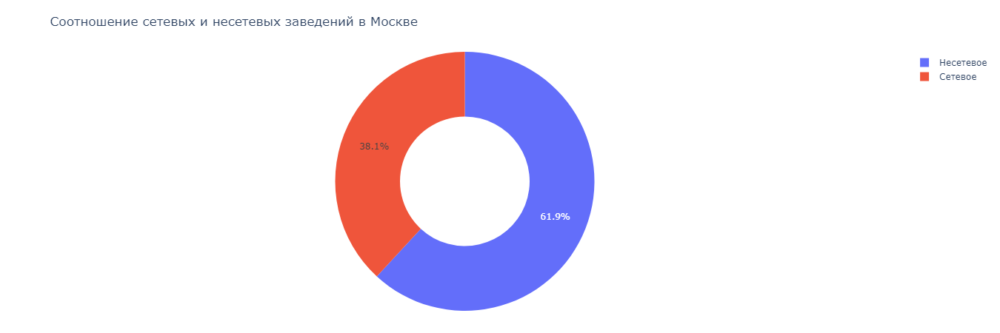

In [32]:
labels = ['Несетевое', 'Сетевое']
values = list(data['chain'].value_counts())

fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.5)])
fig.update_layout(
    autosize=False,
    width=700,
    height=450,
    margin=dict(
        l=50,
        r=50,
        b=30,
        t=70,
        pad=4
    ),
    title='Соотношение сетевых и несетевых заведений в Москве'
)
fig.show()

Несетевых заведений больше, чем сетевых - 61.9% против 38.1%.

### 4. Соотношение сетевых и несетевых заведений по категориям <a class='anchor' id='step_3_4'></a>

Узнаем, какие категории заведений чаще являются сетевыми.

In [33]:
chain_grouped = (pd
                 .pivot_table(data, 
                              index='category', 
                              columns='chain', 
                              values='name', 
                              aggfunc='count')
                 .reset_index()
                 .rename(columns={0:'not_chain',
                                  1:'chain'})
                 .sort_values(by='not_chain', 
                              ascending=False))

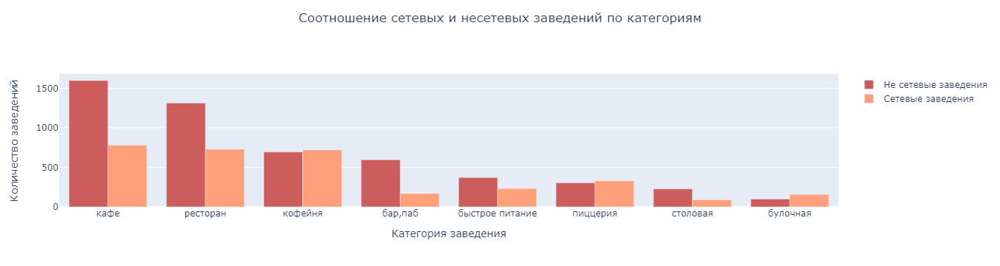

In [34]:
fig = go.Figure()
fig.add_trace(go.Bar(
    x = chain_grouped['category'],
    y = chain_grouped['not_chain'],
    name='Не сетевые заведения',
    marker_color='indianred'
))
fig.add_trace(go.Bar(
    x = chain_grouped['category'],
    y = chain_grouped['chain'],
    name='Сетевые заведения',
    marker_color='lightsalmon'
))
fig.update_layout(barmode='group', xaxis_tickangle=0)
fig.update_layout(
    title={
        'text': 'Соотношение сетевых и несетевых заведений по категориям',
        'xanchor': 'center',
        'yanchor': 'top',
        'y':0.95,
        'x':0.5},
        yaxis_title='Количество заведений',
        xaxis_title='Категория заведения')
fig.show()

Кофейни, пиццерии и булочные имеют схожее соотношение заведений, но чаще бывают сетевыми. Во всех остальных категориях несетевых заведений больше:
- несетевых кафе и ресторанов в 2 раза больше, чем сетевых;
- несетевых баров в 3 раза больше, чем сетевых;
- несетевых столовых в 2 раза больше, чем сетевых.

### 5. Топ-15 популярных сетей питания <a class='anchor' id='step_3_5'></a>

Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. Будем считать, что чем больше у сети точек питания - тем  более известной и популярной она является.

In [35]:
top_chains = (data[data['chain'] == 1]
              .groupby(['name'], 
                       as_index=False)
              .agg({'address':'count'})
              .rename(columns={'address':'total'})
              .sort_values(by = 'total', 
                           ascending=False)
              .head(15))
top_chains

,name,total
746,Шоколадница,120
344,Домино'с Пицца,76
340,Додо Пицца,74
759,Яндекс Лавка,72
148,One Price Coffee,71
59,Cofix,65
170,Prime,50
679,Хинкальная,44
378,КОФЕПОРТ,42
431,Кулинарная лавка братьев Караваевых,39


Самой популярной сетью в Москве является Шоколадница - сеть кофейн. Посмотрим, какими категориями заведений представлена каждая сеть из топ-листа.

In [36]:
chains_detailed = (pd
                   .pivot_table(data[data['chain'] == 1], 
                                index='name', 
                                values='address', 
                                columns='category',
                                aggfunc='count')
                   .reset_index())

In [37]:
top_chains_merged = top_chains.merge(chains_detailed, on='name', how='left')

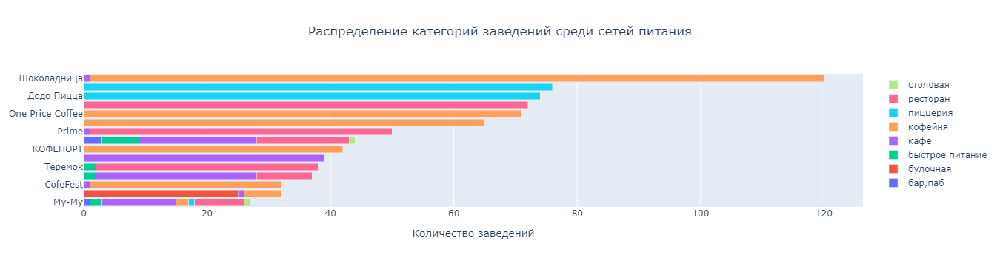

In [38]:
y = top_chains_merged['name']
fig = go.Figure(go.Bar(y=y, x=top_chains_merged['бар,паб'], name='бар,паб', orientation='h'))

for category in top_chains_merged.loc[:, 'булочная':'столовая']:
    fig.add_trace(go.Bar(y=y, x=top_chains_merged[category], name=category, orientation='h'))

fig.update_layout(barmode='stack')
fig.update_layout(yaxis=dict(autorange="reversed"))
fig.update_layout(
    title={
        'text': 'Распределение категорий заведений среди сетей питания',
        'xanchor': 'center',
        'y':0.9,
        'x':0.5},
        xaxis_title='Количество заведений')
fig.show()

Наиболее разноплановыми сетями являются Хинкальная и Му-Му - Хинкальная имеет среди своих заведений 5 различных категорий, Му-Му имеет 7 разных категорий. Во всех остальных сетях разнообразие не превышает 2-3 категории и в основном соответствует своему профилю.

Посмотрим, как популярные сети питания распределены по округам города Москвы.

In [39]:
chains_districts = (pd
                   .pivot_table(data[data['chain'] == 1], 
                                index='name', 
                                values='address', 
                                columns='district',
                                aggfunc='count')
                   .reset_index())

In [40]:
top_chains_dist_merged = top_chains.merge(chains_districts, on='name', how='left')

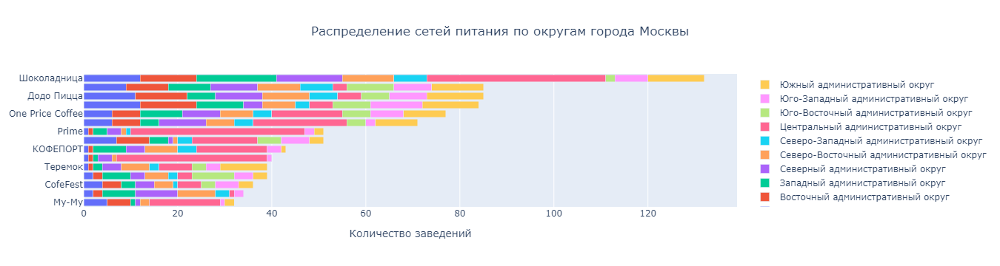

In [41]:
y = top_chains_dist_merged['name']
fig = go.Figure(go.Bar(y=y, x=top_chains_dist_merged['Восточный административный округ'], 
                       name='Восточный административный округ', 
                       orientation='h'))

for category in top_chains_dist_merged.loc[:, 'Восточный административный округ':'Южный административный округ']:
    fig.add_trace(go.Bar(y=y, x=top_chains_dist_merged[category], name=category, orientation='h'))

fig.update_layout(barmode='stack')
fig.update_layout(yaxis=dict(autorange="reversed"))
fig.update_layout(
    title={
        'text': 'Распределение сетей питания по округам города Москвы',
        'xanchor': 'center',
        'y':0.9,
        'x':0.5},
        xaxis_title='Количество заведений')
fig.show()

Все сети равномерно распределили свои точки по всем округам. Можно выделить сети, которые сделали приоритет на Центральный округ - центр города:
- Шоколадница;
- One Price Coffee;
- Prime;
- Хинкальная;
- Кофепорт;
- Кулинарная лавка братьев Караваевых;
- Му-Му.

Данные сети имеют в центре города наибольшую долю своих заведений.

### 6. Распределение категорий по округам <a class='anchor' id='step_3_6'></a>

Посмотрим, какие административные районы Москвы присутствуют в датасете.

In [42]:
districts_grouped = (pd
                     .pivot_table(data, 
                                  index='district', 
                                  columns='category', 
                                  values='name', 
                                  aggfunc='count')
                     .sort_values(by='Центральный административный округ', 
                                  ascending=False, 
                                  axis=1)
                     .reset_index())

districts_grouped['total'] = districts_grouped.loc[:, 'ресторан':].sum(axis=1)
districts_grouped = districts_grouped.sort_values(by='total', ascending=False)

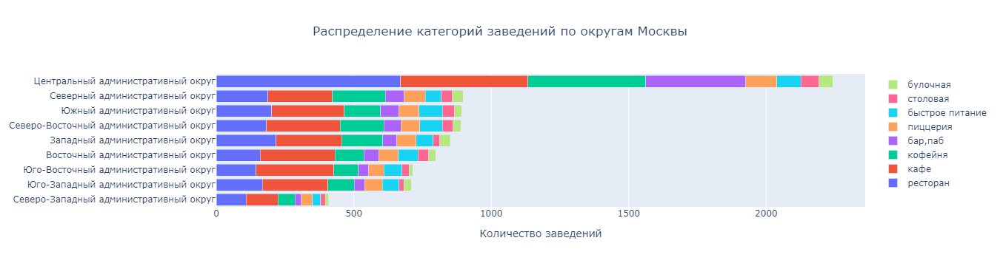

In [43]:
y = districts_grouped['district']
fig = go.Figure(go.Bar(y=y, x=districts_grouped['ресторан'], name='ресторан', orientation='h'))

for category in districts_grouped.loc[:, 'кафе':'булочная']:
    fig.add_trace(go.Bar(y=y, x=districts_grouped[category], name=category, orientation='h'))

fig.update_layout(barmode='stack')
fig.update_layout(yaxis=dict(autorange="reversed"))
fig.update_layout(
    title={
        'text': 'Распределение категорий заведений по округам Москвы',
        'xanchor': 'center',
        'y':0.9,
        'x':0.5},
        xaxis_title='Количество заведений')
fig.show()

Больше всего заведений всех категорий находится в Центральном округе. Наименьшее количество - в Северо-Западном округе.

### 7. Распределение средних рейтингов по категориям <a class='anchor' id='step_3_7'></a>

Посмотрим, как различаются усреднённые рейтинги в разных типах общепита.

In [44]:
avg_rating = (pd
              .pivot_table(data, 
                           index='category', 
                           values='rating', 
                           aggfunc=['mean', 'median'])
              .reset_index()
              .droplevel(1, axis=1)
              .sort_values(by='mean', 
                           ascending=False)
              .style
              .set_caption('Среднее и медиана рейтингов по категориям')
              .background_gradient(low=2))
avg_rating

,category,mean,median
0,"бар,паб",4.39,4.40
5,пиццерия,4.30,4.30
6,ресторан,4.29,4.30
4,кофейня,4.28,4.30
1,булочная,4.27,4.30
7,столовая,4.21,4.30
3,кафе,4.12,4.20
2,быстрое питание,4.05,4.20


Самые высокие рейтинги имеют бары и пабы - в среднем 4.4. Самые низкие оценки имеют заведения быстрого питания - в среднем 4.05, медиана 4.2.

Посмотрим, как различаются рейтинги у сетевых и несетевых заведений.

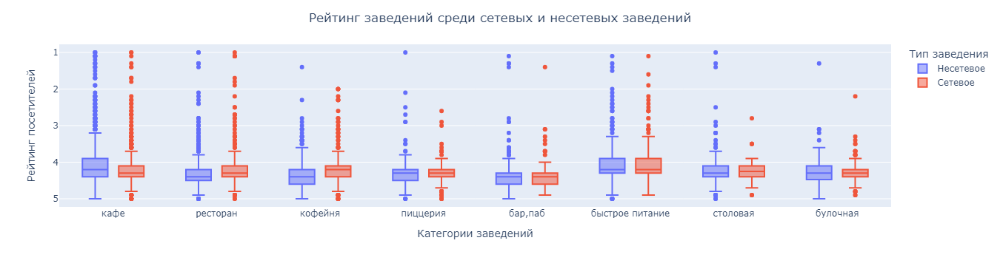

In [45]:
fig = px.box(data, x="category", y="rating", color='chain')
fig.update_layout(yaxis=dict(autorange="reversed"))
fig.update_layout(
    title={
        'text': 'Рейтинг заведений среди сетевых и несетевых заведений',
        'xanchor': 'center',
        'y':0.95,
        'x':0.5},
        xaxis_title='Категории заведений',
        yaxis_title='Рейтинг посетителей')
newnames = {'0':'Несетевое', '1': 'Сетевое'}
fig.update_layout(legend_title_text="Тип заведения")
fig.for_each_trace(lambda t: t.update(name = newnames[t.name]))
fig.show()

Несетевые рестораны и кофейни чаще имеют более высокий рейтинг. Сетевые кафе также чаще имеют более высокий рейтинг, чем несетевые. В остальных категориях значимых различий нет.

Посмотрим, как влияет режим работы на рейтинг заведения.

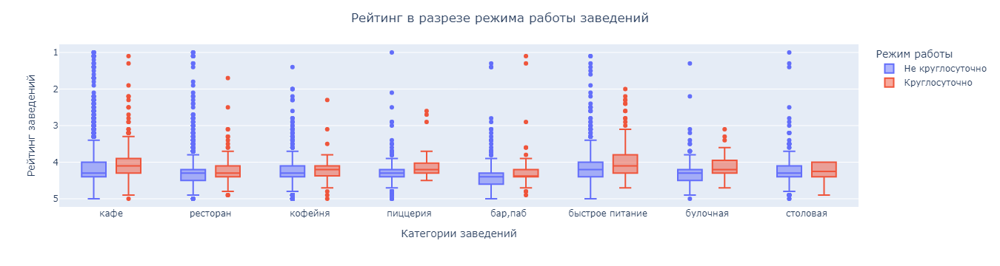

In [46]:
fig = px.box(data, x="category", y="rating", color='is_24/7')
fig.update_layout(yaxis=dict(autorange="reversed"))
fig.update_layout(
    title={
        'text': 'Рейтинг в разрезе режима работы заведений',
        'xanchor': 'center',
        'yanchor': 'top',
        'y':0.95,
        'x':0.5},
        yaxis_title='Рейтинг заведений',
        xaxis_title='Категории заведений')
newnames = {'False':'Не круглосуточно', 'True': 'Круглосуточно'}
fig.update_layout(legend_title_text="Режим работы")
fig.for_each_trace(lambda t: t.update(name = newnames[t.name]))
fig.show()

Круглосуточные заведения имеют более низкий рейтинг во всех категориях по сравнению с заведениями с обычным графиком работы.

### 8. Хороплет со средний рейтингом заведений по округам <a class='anchor' id='step_3_8'></a>

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого округа.

In [47]:
rating_df = data.groupby('district', as_index=False)['rating'].agg('median')
rating_df

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [48]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

m

Заведения с наиболее высоким рейтингом находятся в Центральном округе. Заведения с наиболее низким рейтингом находятся в Северо-Восточном и Юго-Восточном округах.

### 9. Кластеры заведений на карте <a class='anchor' id='step_3_9'></a>

Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки `folium`.

In [49]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data.apply(create_clusters, axis=1)

m

### 10. Топ-15 улиц по количеству заведений <a class='anchor' id='step_3_10'></a>

Найдем топ-15 улиц по количеству заведений и построим график распределения количества заведений и их категорий по этим улицам.

Отобразим хитмэп с количеством категорий на каждой улице.

In [50]:
streets_grouped = (pd
 .pivot_table(data, 
              index='street', 
              columns='category', 
              values='name', 
              aggfunc='count')
 .reset_index())

streets_grouped['total'] = streets_grouped.loc[:, 'бар,паб':].sum(axis=1)
streets_grouped_top_15 = streets_grouped.sort_values(by='total', ascending=False).head(15).fillna(0)

streets_grouped_top_15.style.set_caption('Распределение заведений по улицам').background_gradient(low=0.5, axis=0)

category,street,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
1093,проспект Мира,11.00,4.00,21.00,53.00,36.00,11.00,45.00,2.00,183.00
776,Профсоюзная улица,6.00,4.00,15.00,35.00,18.00,15.00,26.00,3.00,122.00
1089,проспект Вернадского,7.00,1.00,12.00,25.00,16.00,12.00,33.00,2.00,108.00
528,Ленинский проспект,10.00,3.00,2.00,26.00,23.00,5.00,33.00,5.00,107.00
526,Ленинградский проспект,15.00,4.00,2.00,12.00,25.00,9.00,25.00,3.00,95.00
375,Дмитровское шоссе,6.00,2.00,10.00,23.00,11.00,8.00,24.00,4.00,88.00
458,Каширское шоссе,2.00,0.00,10.00,20.00,16.00,5.00,19.00,5.00,77.00
298,Варшавское шоссе,6.00,0.00,7.00,18.00,14.00,4.00,20.00,7.00,76.00
527,Ленинградское шоссе,5.00,2.00,5.00,13.00,13.00,3.00,26.00,3.00,70.00
553,МКАД,1.00,0.00,9.00,45.00,4.00,0.00,5.00,1.00,65.00


На основе данного хитмэпа построим график.

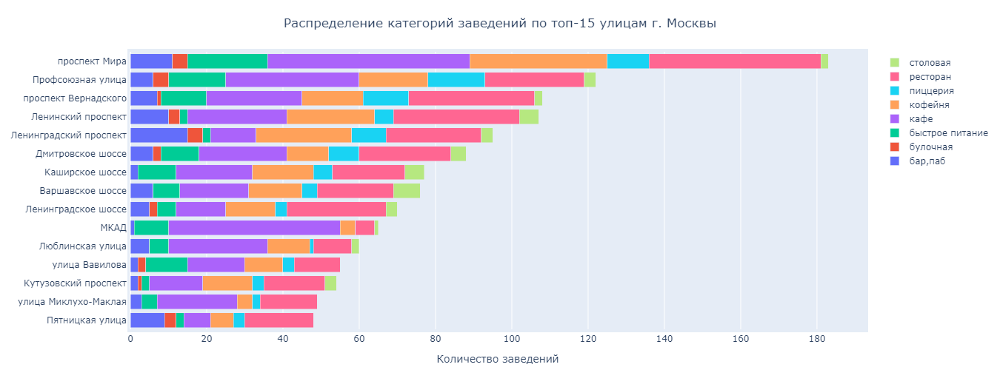

In [51]:
y = streets_grouped_top_15['street']
fig = go.Figure(go.Bar(y=y, x=streets_grouped_top_15['бар,паб'], name='бар,паб', orientation='h'))

for category in streets_grouped_top_15.loc[:, 'булочная':'столовая']:
    fig.add_trace(go.Bar(y=y, x=streets_grouped_top_15[category], name=category, orientation='h'))

fig.update_layout(barmode='stack')
fig.update_layout(yaxis=dict(autorange="reversed"))
fig.update_layout(
    autosize=False,
    width=1000,
    height=500,
    margin=dict(
        l=50,
        r=50,
        b=10,
        t=70,
        pad=4
    )
)
fig.update_layout(
    title={
        'text': 'Распределение категорий заведений по топ-15 улицам г. Москвы',
        'xanchor': 'center',
        'y':0.95,
        'x':0.5},
        xaxis_title='Количество заведений')
fig.show()

Проспект Мира имеет больше всего различных точек питания всех категорий. МКАД на втором месте по количеству кафе (45 шт.) после проспекта Мира (53 шт.). На большинстве улиц превалирует количество ресторанов.

### 11. Улицы с одном объектом питания <a class='anchor' id='step_3_11'></a>

Найдем улицы, на которых находится только один объект общепита.

In [52]:
print('Число улиц с одним объектом:', len(streets_grouped[(streets_grouped['total'] == 1)]))

Число улиц с одним объектом: 462


Найдено 462 улицы с одним объектом. Выполним слияние этого среза данных с основным датафреймом `data` и нанесем геоданные на карту.

In [53]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data.merge(streets_grouped[streets_grouped['total'] == 1], 
           on='street', 
           how='inner').apply(create_clusters, axis=1)

m

Как видно из карты, наличие одного объекта питания на улице чаще связано со следующими факторами:
- близость транспортных и железнодорожных путей;
- индустриальная зона;
- парковая зона;
- набережная зона Москвы реки;
- культурно-историческое пространство (центр города).


### 12. Хороплет со средним чеком по округам <a class='anchor' id='step_3_12'></a>

Значения средних чеков заведений хранятся в столбце `middle_avg_bill`. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитаем медиану этого столбца для каждого округа.

Посмотрим, каковы значения средних чеков (медианные значения) в разбивке по округам города.

In [54]:
avg_bills = pd.pivot_table(data, 
                           index='district', 
                           values='middle_avg_bill', 
                           aggfunc='median').reset_index()
(avg_bills
 .sort_values(by='middle_avg_bill', 
              ascending=False)
 .style
 .background_gradient(low=0.9))

,district,middle_avg_bill
1,Западный административный округ,1000.00
5,Центральный административный округ,1000.00
4,Северо-Западный административный округ,700.00
2,Северный административный округ,650.00
7,Юго-Западный административный округ,600.00
0,Восточный административный округ,575.00
3,Северо-Восточный административный округ,500.00
8,Южный административный округ,500.00
6,Юго-Восточный административный округ,450.00


Нанесем полученные данные на карту и построим хороплет.

In [55]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=avg_bills,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный чек заведений по районам',
).add_to(m)

m

Наиболее высокие средний чек наблюдается в Центральном и Западном административных округах - 1 000 руб. 

Самые низкие чеки наблюдаются в:
- Северо-Восточный административный округ - 500 руб.;
- Южный административный округ - 500 руб.;
- Юго-Восточный административный округ - 450 руб.

Удаление от центра города способствует снижению среднего чека заведения.

### 13. Исследование заведений с низким рейтингом <a class='anchor' id='step_3_13'></a>

Рассмотрим заведения с низким рейтингом. Будем считать заведение плохим, если его рейтинг ниже 3.0.

In [56]:
low_rating_objects = (pd
                      .pivot_table(data[data['rating'] < 3], 
                                   index='district', 
                                   values='address', 
                                   aggfunc='count')
                      .reset_index()
                      .rename(columns={'address':'cnt'}))

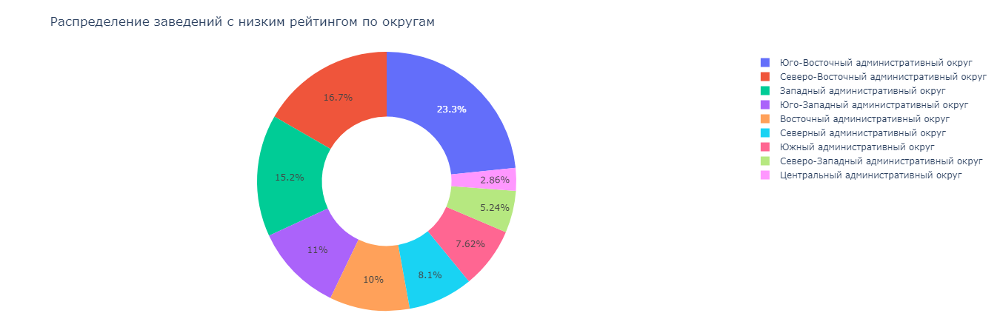

In [57]:
labels = low_rating_objects['district']
values = low_rating_objects['cnt']

fig = go.Figure(data=[go.Pie(labels=labels, 
                             values=values, 
                             hole=.5)])
fig.update_layout(
    autosize=False,
    width=700,
    height=450,
    margin=dict(
        l=50,
        r=50,
        b=30,
        t=70,
        pad=4
    ),
    title='Распределение заведений с низким рейтингом по округам'
)
fig.show()

Больше всего заведений с низким рейтингом (ниже 3.0) в Юго-Восточном административном округе - 49 шт. (23.3%). Меньше всего заведений с низким рейтингом в Центральном административном округе - лишь 6 шт. (2.86%).

In [58]:
(data[data['rating'] < 3]
 .groupby('district')
 .agg({'address':'count', 
       'middle_avg_bill':'mean', 
       'seats':'median'})
 .reset_index()
 .sort_values(by='address', 
              ascending=False))

,district,address,middle_avg_bill,seats
6,Юго-Восточный административный округ,49,523.75,45.0
3,Северо-Восточный административный округ,35,1290.00,62.0
1,Западный административный округ,32,1267.00,120.0
7,Юго-Западный административный округ,23,425.00,70.0
0,Восточный административный округ,21,290.00,24.0
2,Северный административный округ,17,900.00,40.0
8,Южный административный округ,16,470.00,30.0
4,Северо-Западный административный округ,11,1100.00,49.0
5,Центральный административный округ,6,600.00,216.5


Чаще всего заведения с низким рейтингом представляют собой небольшие компактные кафе, размером около 45 посадочных мест и средним чеком около 500 руб.

Посмотрим, какие категории заведений чаще всего получают низкие оценки посетителей.

In [59]:
low_rating_objects_detailed = (pd
                               .pivot_table(data[data['rating'] < 3], 
                                            index='district', 
                                            columns='category', 
                                            values='address', 
                                            aggfunc='count')
                               .reset_index()
                               .sort_values(by='кафе', 
                                            ascending=False))

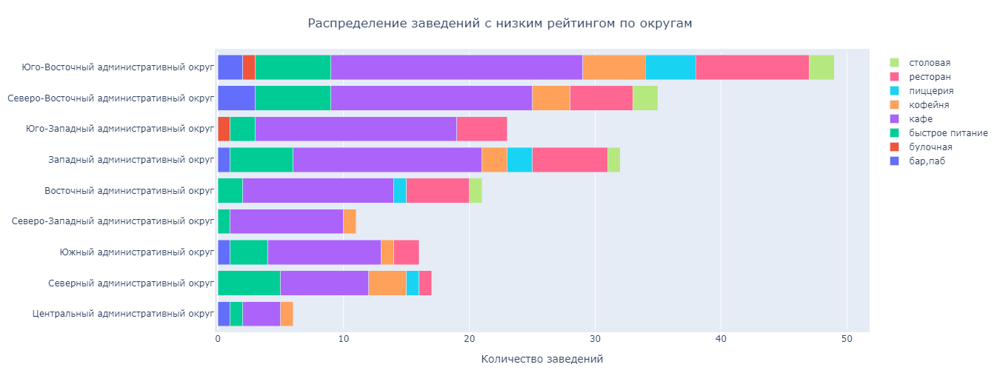

In [60]:
y = low_rating_objects_detailed['district']
fig = go.Figure(go.Bar(y=y, x=low_rating_objects_detailed['бар,паб'], name='бар,паб', orientation='h'))

for category in low_rating_objects_detailed.loc[:, 'булочная':'столовая']:
    fig.add_trace(go.Bar(y=y, x=low_rating_objects_detailed[category], name=category, orientation='h'))

fig.update_layout(barmode='stack')
fig.update_layout(yaxis=dict(autorange="reversed"))
fig.update_layout(
    autosize=False,
    width=1000,
    height=500,
    margin=dict(
        l=50,
        r=50,
        b=10,
        t=70,
        pad=4
    )
)
fig.update_layout(
    title={
        'text': 'Распределение заведений с низким рейтингом по округам',
        'xanchor': 'center',
        'y':0.95,
        'x':0.5},
        xaxis_title='Количество заведений')
fig.show()

Наибольшую долю из заведений с низким рейтингом составляют кафе. Реже всего плохие оценки получают столовые, булочные и пиццерии.

### 14. Выводы <a class='anchor' id='step_3_14'></a>

Соберем наблюдения по вопросам выше в один общий вывод.

1. Наибольшая доля заведений относится к кафе (28.3%, 2 376 шт.), ресторанам (24.3%, 2 042 шт.), кофейням (16.8%, 1 413 шт.).

2. Меньше всего заведений в категориях столовая (3.75%, 315 шт.) и булочная (3.05%, 256 шт.).

3. Больше всего посадочных мест в среднем имеют бары и пабы (124 мест), рестораны (122 мест) и кофейни (111 мест). Медиана и среднее существенно различаются, что говорит о сильном размахе максимальных значений во всех категориях.

4. В самых крупных ресторанах, кофейнях, барах (пабах) и заведениях быстрого питания - количество посадочных мест может достигать 300 и более. Данные заведения являются самыми вместительными, в среднем количество мест в них составляет 100-125 (медианный диапазон 65-86 мест).

5. К наиболее компактным заведениям относятся кафе, пиццерии, булочные и столовые. Количество посадочных мест в них редко превышает диапазон 120-250. Среднее число мест варьируется в диапазоне 90-100 мест (медианный диапазон 50-76 мест).

6. В большинстве категорий сетевые заведения являются более вместительными. Самыми крупными заведениями являются сетевые рестораны: их средний размер может достигать 350 мест (медиана 98, максимум 1 288). Исключениями являются бары и булочные - несетевые заведения этих категорий чаще имеют больше посадочных мест.

7. Заведения, работающие круглосуточно, как правило, имеют меньше посадочных мест и являются более компактными по сравнению с заведениями, работающими в обычном режиме (не круглосуточно). Исключения составляют кофейни и булочные - круглосуточные кофейни не отличаются по размерам от некруглосуточных, круглосуточные булочные более вместительны, чем некруглосуточные.

8. Несетевых заведений больше, чем сетевых - 61.9% против 38.1%.

9. Кофейни, пиццерии и булочные имеют схожее соотношение заведений, но чаще бывают сетевыми. Во всех остальных категориях несетевых заведений больше. Несетевых кафе и ресторанов в 2 раза больше, чем сетевых. Несетевых баров в 3 раза больше, чем сетевых. Несетевых столовых в 2 раза больше, чем сетевых.

10. Самой популярной сетью в Москве является Шоколадница - сеть кофейн.

11. Наиболее разноплановыми сетями являются Хинкальная и Му-Му - Хинкальная имеет среди своих заведений 5 различных категорий, Му-Му имеет 7 разных категорий. Во всех остальных сетях разнообразие не превышает 2-3 категории и в основном соответствует своему профилю.

12. Все сети равномерно распределили свои точки по всем округам. Можно выделить сети, которые сделали приоритет на Центральный округ - центр города: Шоколадница, One Price Coffee, Prime, Хинкальная, Кофепорт, Кулинарная лавка братьев Караваевых, Му-Му. Данные сети имеют в центре города наибольшую долю своих заведений.

13. Больше всего заведений всех категорий находится в Центральном округе. Наименьшее количество - в Северо-Западном округе.

14. Самые высокие рейтинги имеют бары и пабы - в среднем 4.4. Самые низкие оценки имеют заведения быстрого питания - в среднем 4.05, медиана 4.2.

15. Несетевые рестораны и кофейни чаще имеют более высокий рейтинг. Сетевые кафе также чаще имеют более высокий рейтинг, чем несетевые. В остальных категориях значимых различий нет.

16. Круглосуточные заведения имеют более низкий рейтинг во всех категориях по сравнению с заведениями с обычным графиком работы.

17. Заведения с наиболее высоким рейтингом находятся в Центральном округе. Заведения с наиболее низким рейтингом находятся в Северо-Восточном и Юго-Восточном округах.

18. Проспект Мира имеет больше всего различных точек питания всех категорий. МКАД на втором месте по количеству кафе (45 шт.) после проспекта Мира (53 шт.). На большинстве улиц превалирует количество ресторанов.

19. Найдено 462 улицы с одним объектом. Наличие одного объекта питания на улице чаще связано с близостью транспортных и железнодорожных путей, наличием индустриальной зоны, парковой зоны, набережной зоны Москвы реки, культурно-исторического пространства (центр города).

20. Наиболее высокие средние чеки наблюдается в Центральном и Западном административных округах - 1 000 руб.

21. Самые низкие чеки наблюдаются в Северо-Восточном административном округе - 500 руб., Южном административном округе - 500 руб., Юго-Восточном административном округе - 450 руб. Удаление от центра города способствует снижению среднего чека заведения.

22. Больше всего заведений с низким рейтингом (ниже 3.0) в Юго-Восточном административном округе - 49 шт. (23.3%). Меньше всего заведений с низким рейтингом в Центральном административном округе - лишь 6 шт. (2.86%).

23. Чаще всего заведения с низким рейтингом представляют собой небольшие компактные кафе, размером около 45 посадочных мест и средним чеком около 500 руб.

24. Наибольшую долю из заведений с низким рейтингом составляют кафе. Реже всего плохие оценки получают столовые, булочные и пиццерии.

[Назад к содержанию](#table_of_contents)

## Шаг 4. Исследование рынка кофеен <a class='anchor' id='step_4'></a>

Ответим на следующие вопросы:
- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

Посмотрим, сколько всего кофеен в датасете.

In [61]:
print('Всего кофеен в датасете:', len(data[data['category'] == 'кофейня']))

Всего кофеен в датасете: 1413


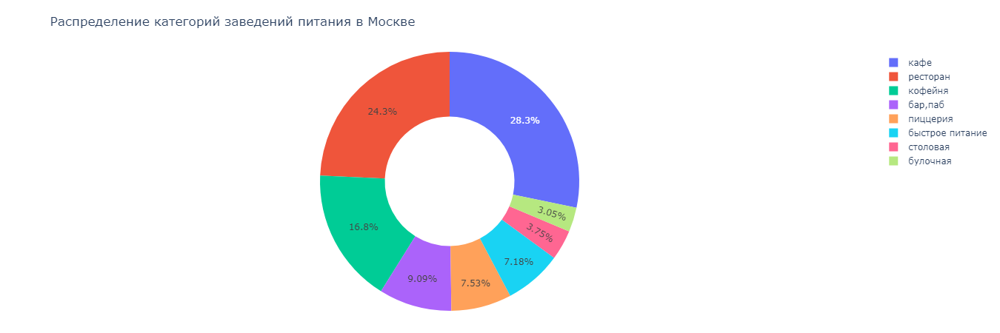

In [62]:
labels = categories_grouped['category']
values = categories_grouped['cnt']

fig = go.Figure(data=[go.Pie(labels=labels, 
                             values=values, 
                             hole=.5)])
fig.update_layout(
    autosize=False,
    width=700,
    height=450,
    margin=dict(
        l=50,
        r=50,
        b=30,
        t=70,
        pad=4
    ),
    title='Распределение категорий заведений питания в Москве'
)
fig.show()

Всего в датасете 1 413 кофеен (16.8%). Кофейни на третьем месте по количеству заведений по сравнению с другими категориями.

Узнаем соотношение круглосуточных и некруглосуточных кофеен.

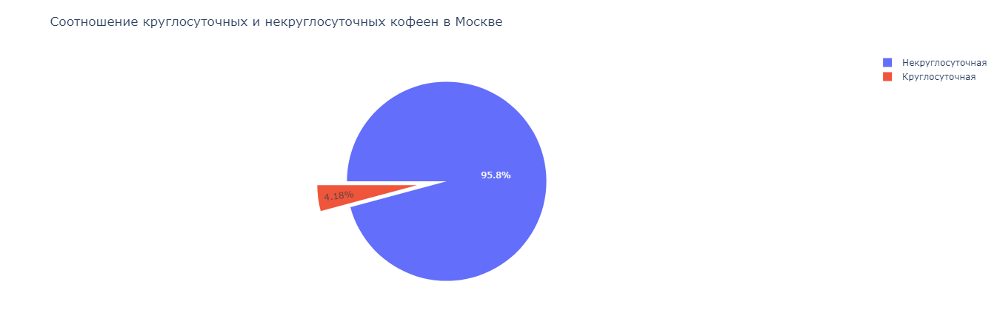

In [63]:
labels = ['Некруглосуточная', 'Круглосуточная']
values = list(data[data['category'] == 'кофейня']['is_24/7'].value_counts())

fig = go.Figure(data=[go.Pie(labels=labels, values=values, pull=[0, 0.3], rotation=-90)])
fig.update_layout(
    autosize=False,
    width=700,
    height=450,
    margin=dict(
        l=50,
        r=50,
        b=30,
        t=70,
        pad=4
    ),
    title='Соотношение круглосуточных и некруглосуточных кофеен в Москве'
)
fig.show()

Лишь 4.18% кофеен являются круглосуточными, 95.8% - некруглосуточные.

Посмотрим, как распределены кофейни по округам.

In [64]:
coffee_house_grouped = (pd
                        .pivot_table(data[data['category'] == 'кофейня'], 
                                     index='district', 
                                     values='address', 
                                     aggfunc='count')
                        .reset_index()
                        .rename(columns={'address':'cnt'})
                        .sort_values(by='cnt', ascending=False))

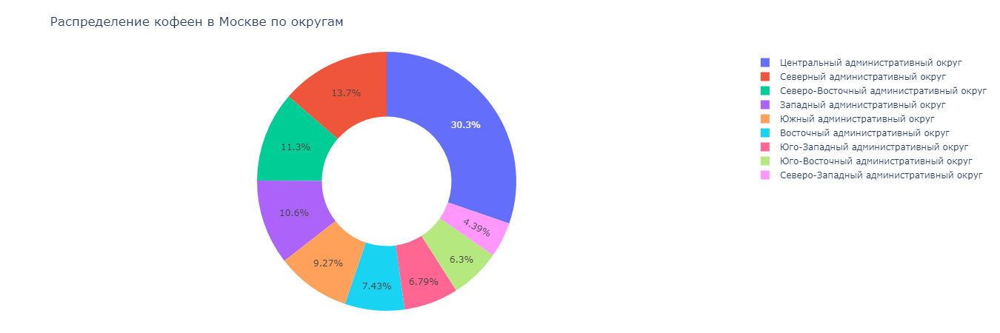

In [65]:
labels = coffee_house_grouped['district']
values = coffee_house_grouped['cnt']

fig = go.Figure(data=[go.Pie(labels=labels, 
                             values=values, 
                             hole=.5)])
fig.update_layout(
    autosize=False,
    width=700,
    height=450,
    margin=dict(
        l=50,
        r=50,
        b=30,
        t=70,
        pad=4
    ),
    title='Распределение кофеен в Москве по округам'
)
fig.show()

Больше всего кофеен находится в Центральном округе - 428 шт. (30.3%). Меньше всего кофеен в Северо-Западном округе - 62 шт (4.39%).

Узнаем распределение рейтингов кофеен по округам.

In [66]:
coffee_house_ratings = (pd
              .pivot_table(data[data['category'] == 'кофейня'], 
                           index='district', 
                           values='rating', 
                           aggfunc=['mean', 'median'])
              .reset_index()
              .droplevel(1, axis=1)
              .sort_values(by='mean', 
                           ascending=False)
              .style
              .set_caption('Среднее и медиана рейтингов кофеен')
              .background_gradient(low=2))
coffee_house_ratings

,district,mean,median
5,Центральный административный округ,4.34,4.30
4,Северо-Западный административный округ,4.33,4.30
2,Северный административный округ,4.29,4.30
7,Юго-Западный административный округ,4.28,4.30
0,Восточный административный округ,4.28,4.30
8,Южный административный округ,4.23,4.30
6,Юго-Восточный административный округ,4.23,4.30
3,Северо-Восточный административный округ,4.22,4.30
1,Западный административный округ,4.20,4.20


Кофейни с наиболее высоким рейтингом находятся в Центральном округе (средний рейтинг 4.34). Кофейни с наиболее низким рейтингом находятся в Западном округе (средний рейтинг 4.2)

Узнаем, какие сети кофеен являются самыми популярными.

In [67]:
(data[data['category'] == 'кофейня']
 .groupby('name')
 .agg({'address':'count', 'rating':'mean'})
 .sort_values(by='address', ascending=False)
 .reset_index()
 .round({'rating':2})
 .head(10))

,name,address,rating
0,Шоколадница,119,4.18
1,One Price Coffee,71,4.06
2,Cofix,65,4.08
3,КОФЕПОРТ,42,4.15
4,CofeFest,31,3.98
5,Кофемания,22,4.46
6,Cinnabon,20,3.92
7,Правда кофе,12,4.25
8,Krispy Kreme,9,4.23
9,Кофейня,9,3.87


Самой популярной сетью кофеен является Шоколадница - 119 кофеен со средним рейтингом 4.18. Более высокий средний рейтинг наблюдается у сетей Кофемания (4.46, 22 кофейни), Правда кофе (4.25, 12 кофеен) и Krispy Kreme (4.23, 9 кофеен).

Поскольку в Северо-Западном административном округе находится наименьшее количество кофеен (62 шт., 4.39%), рассмотрим данный округ как кандидата для открытия кофейни. Открытие кофейни в этом округе может удовлетворить спрос потребителей. Нанесем все имеющиеся кофейни округа на карту и изучим их расположение.

In [68]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data[(data['category'] == 'кофейня') & (data['district'] == 'Северо-Западный административный округ')].apply(create_clusters, axis=1)

m

В качестве вариантов местоположения для открытия следует рассмотреть район:
- Хорошево-Мневники - данный район ближе всего к центру и имеет лишь 11 кофеен. Наиболее оптимальное расположение в районе - проспект Маршала Жукова.

Рассмотрим среднюю цену чашки капучино в Северо-Западном округе.

In [69]:
data[(data['category'] == 'кофейня') & 
     (data['district'] == 'Северо-Западный административный округ') & 
     (data['avg_bill'].str.contains('Цена чашки капучино'))]['avg_bill']

305     Цена чашки капучино:200–300 ₽
323     Цена чашки капучино:150–180 ₽
343     Цена чашки капучино:119–179 ₽
358     Цена чашки капучино:100–170 ₽
359     Цена чашки капучино:239–274 ₽
443     Цена чашки капучино:150–240 ₽
488       Цена чашки капучино:от 60 ₽
614         Цена чашки капучино:120 ₽
630       Цена чашки капучино:от 90 ₽
1189    Цена чашки капучино:150–290 ₽
1260    Цена чашки капучино:109–169 ₽
1266    Цена чашки капучино:149–199 ₽
1281    Цена чашки капучино:239–274 ₽
1303    Цена чашки капучино:149–199 ₽
1378    Цена чашки капучино:159–200 ₽
1481    Цена чашки капучино:220–320 ₽
1553     Цена чашки капучино:60–120 ₽
1586     Цена чашки капучино:90–100 ₽
3142     Цена чашки капучино:от 200 ₽
3148    Цена чашки капучино:120–150 ₽
3234     Цена чашки капучино:90–158 ₽
Name: avg_bill, dtype: object

Минимальная цена чашки капучино начинается с 60 руб. и доходит до 300 руб. В среднем оптимальная цена чашки кофе составляет 100-150 руб.

[Назад к содержанию](#table_of_contents)

## Шаг 5. Вывод <a class='anchor' id='final'></a>

Подведем итоги проделанной работы по каждому шагу.

В **шаге 1** были загружены необходимые библиотеки, датасеты, проведен первичный обзор данных.

В **шаге 2** была выполнена следующая преобработка:
1. Датасет проверен на наличие неявных дубликатов в связке названий и адресов, 4 дубликата устранено.
2. Устранены 3 дубликата сети "Яндекс Лавка".
3. В датасете было обнаружено значительное количество пропусков, но было принято решение оставить пропуски - заполнение медианными значениями внутри каждой категории исказит распределение данных в дальнейшем анализе (к примеру, количество мест, средний рейтинг и средний чек). 
4. Пропуски столбца `hours` были заполнены прочерками.
5. Названия улиц были выделены в отдельный столбец `street`.
6. Добавлен столбец `is_24/7` с обозначением круглосуточной работы заведения.
7. Была проведена замена сокращений и устранение других неявных дубликатов.

В **шаге 3** были получены следующие выводы:

1. Наибольшая доля заведений относится к кафе (28.3%, 2 376 шт.), ресторанам (24.3%, 2 042 шт.), кофейням (16.8%, 1 413 шт.).

2. Меньше всего заведений в категориях столовая (3.75%, 315 шт.) и булочная (3.05%, 256 шт.).

3. Больше всего посадочных мест в среднем имеют бары и пабы (124 мест), рестораны (122 мест) и кофейни (111 мест). Медиана и среднее существенно различаются, что говорит о сильном размахе максимальных значений во всех категориях.

4. В самых крупных ресторанах, кофейнях, барах (пабах) и заведениях быстрого питания - количество посадочных мест может достигать 300 и более. Данные заведения являются самыми вместительными, в среднем количество мест в них составляет 100-125 (медианный диапазон 65-86 мест).

5. К наиболее компактным заведениям относятся кафе, пиццерии, булочные и столовые. Количество посадочных мест в них редко превышает диапазон 120-250. Среднее число мест варьируется в диапазоне 90-100 мест (медианный диапазон 50-76 мест).

6. В большинстве категорий сетевые заведения являются более вместительными. Самыми крупными заведениями являются сетевые рестораны: их средний размер может достигать 350 мест (медиана 98, максимум 1 288). Исключениями являются бары и булочные - несетевые заведения этих категорий чаще имеют больше посадочных мест.

7. Заведения, работающие круглосуточно, как правило, имеют меньше посадочных мест и являются более компактными по сравнению с заведениями, работающими в обычном режиме (не круглосуточно). Исключения составляют кофейни и булочные - круглосуточные кофейни не отличаются по размерам от некруглосуточных, круглосуточные булочные более вместительны, чем некруглосуточные.

8. Несетевых заведений больше, чем сетевых - 61.9% против 38.1%.

9. Кофейни, пиццерии и булочные имеют схожее соотношение заведений, но чаще бывают сетевыми. Во всех остальных категориях несетевых заведений больше. Несетевых кафе и ресторанов в 2 раза больше, чем сетевых. Несетевых баров в 3 раза больше, чем сетевых. Несетевых столовых в 2 раза больше, чем сетевых.

10. Самой популярной сетью в Москве является Шоколадница - сеть кофейн.

11. Наиболее разноплановыми сетями являются Хинкальная и Му-Му - Хинкальная имеет среди своих заведений 5 различных категорий, Му-Му имеет 7 разных категорий. Во всех остальных сетях разнообразие не превышает 2-3 категории и в основном соответствует своему профилю.

12. Все сети равномерно распределили свои точки по всем округам. Можно выделить сети, которые сделали приоритет на Центральный округ - центр города: Шоколадница, One Price Coffee, Prime, Хинкальная, Кофепорт, Кулинарная лавка братьев Караваевых, Му-Му. Данные сети имеют в центре города наибольшую долю своих заведений.

13. Больше всего заведений всех категорий находится в Центральном округе. Наименьшее количество - в Северо-Западном округе.

14. Самые высокие рейтинги имеют бары и пабы - в среднем 4.4. Самые низкие оценки имеют заведения быстрого питания - в среднем 4.05, медиана 4.2.

15. Несетевые рестораны и кофейни чаще имеют более высокий рейтинг. Сетевые кафе также чаще имеют более высокий рейтинг, чем несетевые. В остальных категориях значимых различий нет.

16. Круглосуточные заведения имеют более низкий рейтинг во всех категориях по сравнению с заведениями с обычным графиком работы.

17. Заведения с наиболее высоким рейтингом находятся в Центральном округе. Заведения с наиболее низким рейтингом находятся в Северо-Восточном и Юго-Восточном округах.

18. Проспект Мира имеет больше всего различных точек питания всех категорий. МКАД на втором месте по количеству кафе (45 шт.) после проспекта Мира (53 шт.). На большинстве улиц превалирует количество ресторанов.

19. Найдено 462 улицы с одним объектом. Наличие одного объекта питания на улице чаще связано с близостью транспортных и железнодорожных путей, наличием индустриальной зоны, парковой зоны, набережной зоны Москвы реки, культурно-исторического пространства (центр города).

20. Наиболее высокие средние чеки наблюдается в Центральном и Западном административных округах - 1 000 руб.

21. Самые низкие чеки наблюдаются в Северо-Восточном административном округе - 500 руб., Южном административном округе - 500 руб., Юго-Восточном административном округе - 450 руб. Удаление от центра города способствует снижению среднего чека заведения.

22. Больше всего заведений с низким рейтингом (ниже 3.0) в Юго-Восточном административном округе - 49 шт. (23.3%). Меньше всего заведений с низким рейтингом в Центральном административном округе - лишь 6 шт. (2.86%).

23. Чаще всего заведения с низким рейтингом представляют собой небольшие компактные кафе, размером около 45 посадочных мест и средним чеком около 500 руб.

24. Наибольшую долю из заведений с низким рейтингом составляют кафе. Реже всего плохие оценки получают столовые, булочные и пиццерии.

В **шаге 4** были получены следующие выводы:
1. Всего в датасете 1 413 кофеен (16.8%). Кофейни на третьем месте по количеству заведений по сравнению с другими категориями.
2. Лишь 4.18% кофеен являются круглосуточными, 95.8% - некруглосуточные.
3. Больше всего кофеен находится в Центральном округе - 428 шт. (30.3%). Меньше всего кофеен в Северо-Западном округе - 62 шт (4.39%).
4. Кофейни с наиболее высоким рейтингом находятся в Центральном округе (средний рейтинг 4.34). Кофейни с наиболее низким рейтингом находятся в Западном округе (средний рейтинг 4.2)
5. Самой популярной сетью кофеен является Шоколадница - 119 кофеен со средним рейтингом 4.18. 
6. Более высокий средний рейтинг, чем у сети Шоколадница наблюдается у сетей Кофемания (4.46, 22 кофейни), Правда кофе (4.25, 12 кофеен) и Krispy Kreme (4.23, 9 кофеен).
7. Северо-Западный административный округ был рекомендован в качестве кандидата для открытия кофейни - в нем находится наименьшее количество кофеен (62 шт., 4.39%). Открытие кофейни в этом округе может удовлетворить спрос потребителей.
8. Район Хорошево-Мневники был рекомендован в качестве варианта местоположения для открытия кофейни - данный район ближе всего к центру и имеет лишь 11 кофеен. 
9. Рекомендовано наиболее оптимальное расположение в районе Хорошево-Мневники - проспект Маршала Жукова.
10. Рекомендована оптимальная цена чашки кофе при открытии кофейни - 100-150 руб. В среднем минимальная цена чашки капучино начинается с 60 руб. и доходит до 300 руб.

[Назад к содержанию](#table_of_contents)